In [1]:
import sys
sys.path.insert(1, '../')
#
import math
import numpy as np              # scientific computing tools
import wrappers                 # for compilation of Fortran Hamiltonian codes
import geometry2d.database
import geometry2d.conjugate
import geometry2d.errors
import geometry2d.geodesic
import geometry2d.plottings
import geometry2d.problem
import geometry2d.splitting
import geometry2d.utils
import geometry2d.wavefront
import geometry2d.sphere
import nutopy as nt
import scipy
import matplotlib.pyplot as plt # for plots
%matplotlib inline

In [2]:
#
color_hyperbolic_2D = 'red'
color_hyperbolic_3D = (1.0, 0.2, 0.2)
color_elliptic_2D = 'blue'
color_elliptic_3D = (0.2, 0.2, 1.0)
color_abnormal_2D = (0.2, 0.8, 0.2) #'green'
color_abnormal_3D = (0.2, 1.0, 0.2)
color_cut_locus  = 'black'
color_conjugate  = 'magenta'
color_wavefront  = 'orange'
color_sphere     = 'orange'
#
color_strong_domain_2d = 'lightblue'
color_strong_domain_3d = 'black'
#
PLANE = geometry2d.plottings.Coords.PLANE
SPHERE = geometry2d.plottings.Coords.SPHERE

In [3]:
# print Fortran code of the Hamiltonian: print hfun.f90 file
with open('hfun.f90', 'r') as f:
    print(f.read())

! Landau
subroutine hfun(x, p, c, h)

    double precision, intent(in)  :: x(2), p(2), c(4)
    double precision, intent(out) :: h

    ! local variables
    double precision :: r, th, pr, pth
    double precision :: m2, a, g1, g2, g3, cr, sr, ct, st, mu1, mu2

    r   = x(1)
    th  = x(2)

    pr  = p(1)
    pth = p(2)

    cr = cos(r)
    sr = sin(r)
    ct = cos(th)
    st = sin(th)

    g1 = c(1)
    g2 = c(2)
    g3 = c(3)
    a  = c(4)

    mu1 = a*g1*cr*sr+(g2-g3)*ct*st*sr-a*(g2*ct**2+g3*st**2)*cr*sr 
    mu2 = a*(g2-g3)*ct*st-g1*cr+(g3*st**2+g2*ct**2)*cr

    m2   = sin(r)**2

    h   = mu1*pr + mu2*pth + sqrt(pr**2 + pth**2/m2)

end subroutine hfun


In [4]:
def m2_fun(r):
    return np.sin(r)**2

def g2_Landau(r):
    return m2_fun(r)

def initialize(θ0, r0, γ1, γ2, γ3, α):

    # Parameters
    λ = [γ1, γ2, γ3, α] # parameters of the Hamiltonian
    t0 = 0.0        # initial time

    name = 'landau' # name of the problem

    # Initialize data
    data_file = 'data_landau.json'
    restart   = False # restart or not the computations
    data      = geometry2d.database.Data({'name': name,
                        't0': t0, 
                        'r0': r0, 
                        'θ0': θ0, 
                        'λ': λ}, data_file, restart)

    # Initial point
    q0 = np.array([r0, θ0])

    # Hamiltonian and derivatives up to order 3
    H = wrappers.hamiltonian(np.array(λ), compile=False, display=False)

    # The Riemannian metric associated to the Zermelo problem
    # g = g1 dr^2 + g2 dθ^2
    def g(q):
        r  = q[0] 
        g1 = 1.0
        g2 = g2_Landau(r)
        return g1, g2

    # problem
    prob = geometry2d.problem.GeometryProblem2D(name, H, g, t0, q0, data, 
                                                steps_for_geodesics=200, modulo=2*np.pi)
    
    return prob

In [5]:
# gamma2-gamma1
def K_fun(alpha, delta):
    return delta**2*(1+alpha**2)/4.0

def domain_strong_current(alpha, delta):
    #
    K = K_fun(alpha, delta)
    
    # North hemisphere
    rp1 = math.asin(1/np.sqrt(K))/2.0
    rp2 = (math.pi - math.asin(1/np.sqrt(K))) / 2.0

    # South hemisphere
    rm1 = (-math.asin(1/np.sqrt(K)) % (2*np.pi) )/2.0
    rm2 = (math.pi + math.asin(1/np.sqrt(K))) / 2.0
    
    return rp1, rp2, rm1, rm2

In [6]:
def update_2d_plot(fig):
    ax = fig.axes[0]
    # set xlims
    ax.set_xlim(-np.pi/3, 2*np.pi + np.pi/3)
    # add vertical lines
    ax.axvline(2*np.pi, color='k', linewidth=0.5, linestyle="dashed", zorder=geometry2d.plottings.z_order_axes)
    ax.axvline(1*np.pi, color='k', linewidth=0.5, linestyle="dashed", zorder=geometry2d.plottings.z_order_axes)
    # set ylabel to "r" 
    ax.set_ylabel(r'$r$', rotation=0, labelpad=10)
    # set yticks: 0 => \pi/2, pi/2 => \pi, -pi/2 => 0
    ax.set_yticks([-np.pi/2, 0.0, np.pi/2])
    ax.set_yticklabels([r'$0$', r'$\frac{\pi}{2}$', r'$\pi$'])
    # set xticks: 0, pi and 2pi
    ax.set_xticks([0.0, np.pi, 2*np.pi])
    ax.set_xticklabels([r'$0$', r'$\pi$', r'$2\pi$'])
    return fig

In [7]:
def F_current(r, θ, γ1, γ2, γ3, α):
    c = 1 + α**2
    γ13 = γ1 - γ3
    γ23 = γ2 - γ3
    F = c*np.sin(r)**2 * ( γ23**2 * np.sin(2*θ)**2 / 4 + 
                          np.cos(r)**2 * (γ13 - γ23 * np.cos(θ)**2)**2 )
    return np.sqrt(F)
    
def plot_F_contour(γ1, γ2, γ3, α):

    # on fait en theta, phi = r-pi/2 mais on dit que l'on est en theta, r
    offset = np.pi/2
    
    #
    N = 300
    rs = np.linspace(0.0, np.pi, N)
    θs = np.linspace(-np.pi-0.1, 2.0*np.pi+0.1, N)
    
    R, Θ = np.meshgrid(rs, θs)
    F = np.zeros_like(R)
    for i, j in np.ndindex(R.shape):
        F[i,j] = F_current(R[i,j], Θ[i,j], γ1, γ2, γ3, α)
    F_current_max = np.max(F)
    
    fig, ax = plt.subplots()

    fig.set_figwidth(15)
    fig.set_figheight(10)
    
    # plot the surface with a view 'from above' in the (θ, r) plane
    #ax.plot_surface(Θ, R, F, cmap='viridis', edgecolor='none')    
    
    # add colorbar
    fig.colorbar(ax.pcolor(Θ, R-offset, F, cmap='plasma', vmin=0.0, vmax=F_current_max, alpha=1, edgecolors='face', antialiaseds=True))
    
    fontsize=16
    ax.set_xlabel(r'$\theta$', fontsize=fontsize)
    ax.set_ylabel(r'$r$', fontsize=fontsize, rotation=0)
    
    # levels
    ax.contour(Θ, R-offset, F, levels=[1.0], colors='cyan')
    
    # set xlims and ylims
    ax.set_xlim([-np.pi, 2.0*np.pi])
    ax.set_ylim([0.0-offset, np.pi-offset])
    
    # x ticks
    ax.set_xticks([-np.pi, -np.pi/2.0, 0.0, np.pi/2, np.pi, 3*np.pi/2, 2*np.pi])
    ax.set_xticklabels([r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$', r'$3\pi/2$', r'$2\pi$'], fontsize=fontsize)
            
    # set yticks: 0 => \pi/2, pi/2 => \pi, -pi/2 => 0
    ax.set_yticks([0.0-offset, np.pi/4-offset, np.pi/2-offset, 3*np.pi/4-offset, np.pi-offset])
    ax.set_yticklabels([r'$0$', r'$\frac{\pi}{4}$', r'$\frac{\pi}{2}$', r'$\frac{3\pi}{4}$', r'$\pi$'], fontsize=fontsize)

    return fig, ax

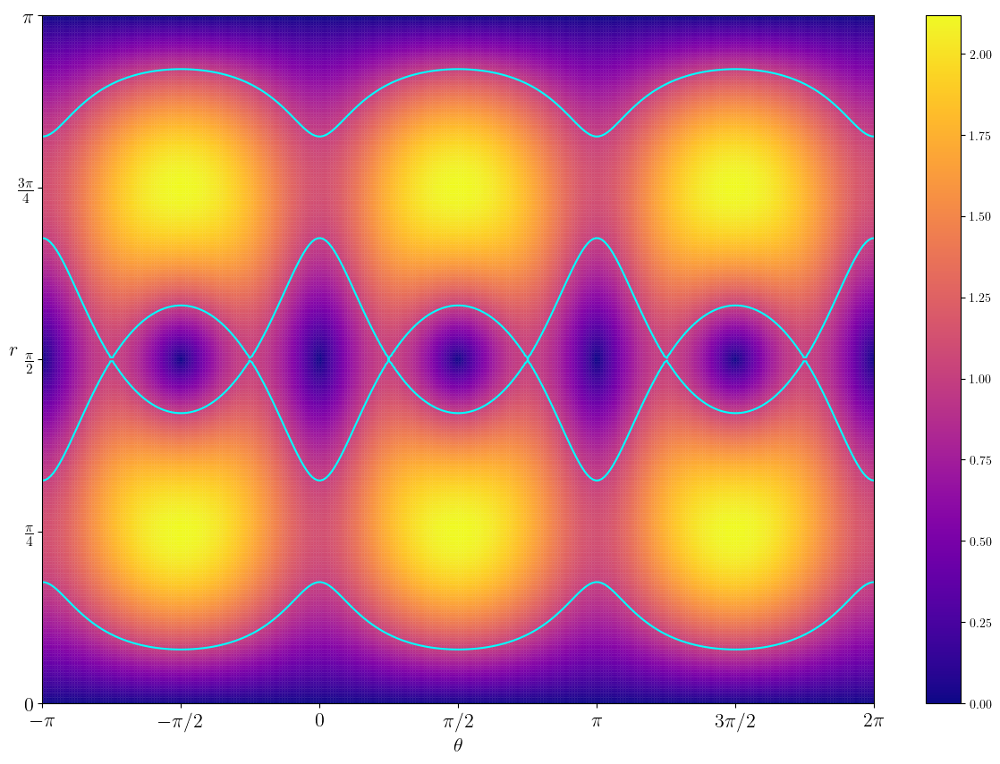

In [8]:
γ1, γ2, α = 1.0, 2.0, 2.0
γ3_limite_sup = γ2 + 2/(np.sqrt(1+α**2))
γ3 = γ3_limite_sup
fig, ax = plot_F_contour(γ1, γ2, γ3, α)
#fig.savefig('gamma3_1_2_sing_2.pdf', dpi=300, transparent=True, format="pdf", bbox_inches='tight')

# Problem definition

In [9]:
alpha_Landau = 1.0
delta_Landau = 1.0 # gamma2-gamma1

K = K_fun(alpha_Landau, delta_Landau)
print("K = " + str(K))

if K > 1:
    raise ValueError('K should be > 1')

θ0 = 0.0
r0 = np.pi/2.0 
γ1 = 1.0
γ2 = γ1+delta_Landau
γ3 = γ2
α  = alpha_Landau
    
prob = initialize(θ0, r0, γ1, γ2, γ3, α)

geodesic = geometry2d.geodesic.Geodesic(prob)

K = 0.5


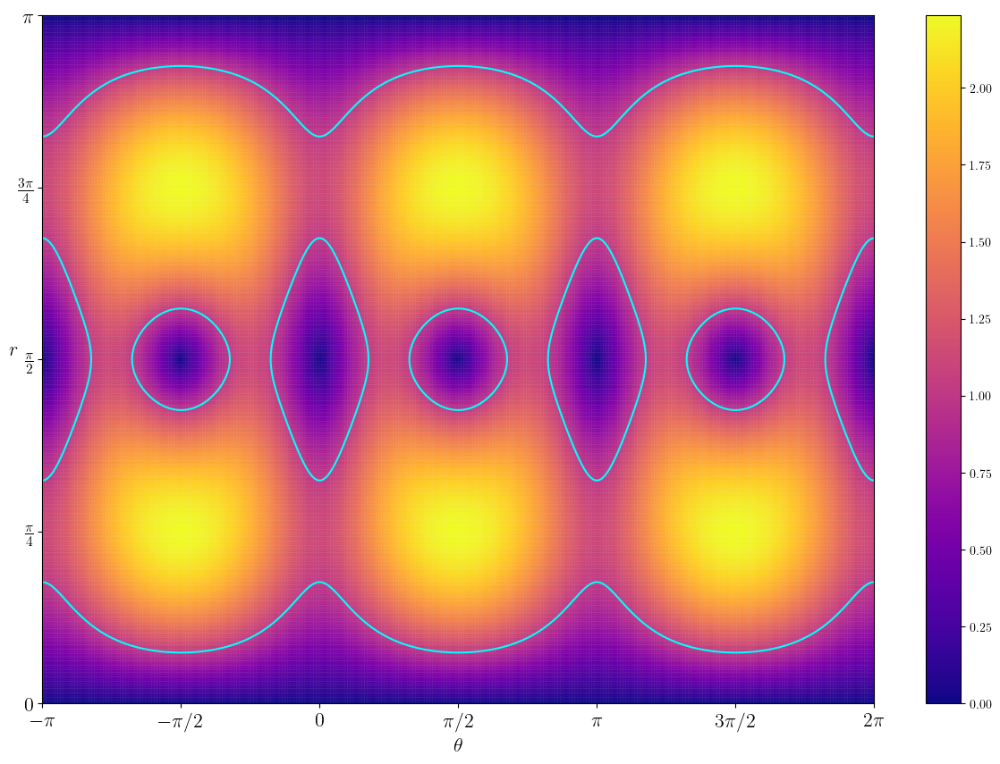

In [10]:
γ1, γ2, γ3, α = 1.0, 2.0, 3.0, 2.0
fig, ax = plot_F_contour(γ1, γ2, γ3, α)

In [11]:
θ0 = 3*np.pi/4.0
r0 = np.pi/2.0 
prob = initialize(θ0, r0, γ1, γ2, γ3, α)
geodesic = geometry2d.geodesic.Geodesic(prob)

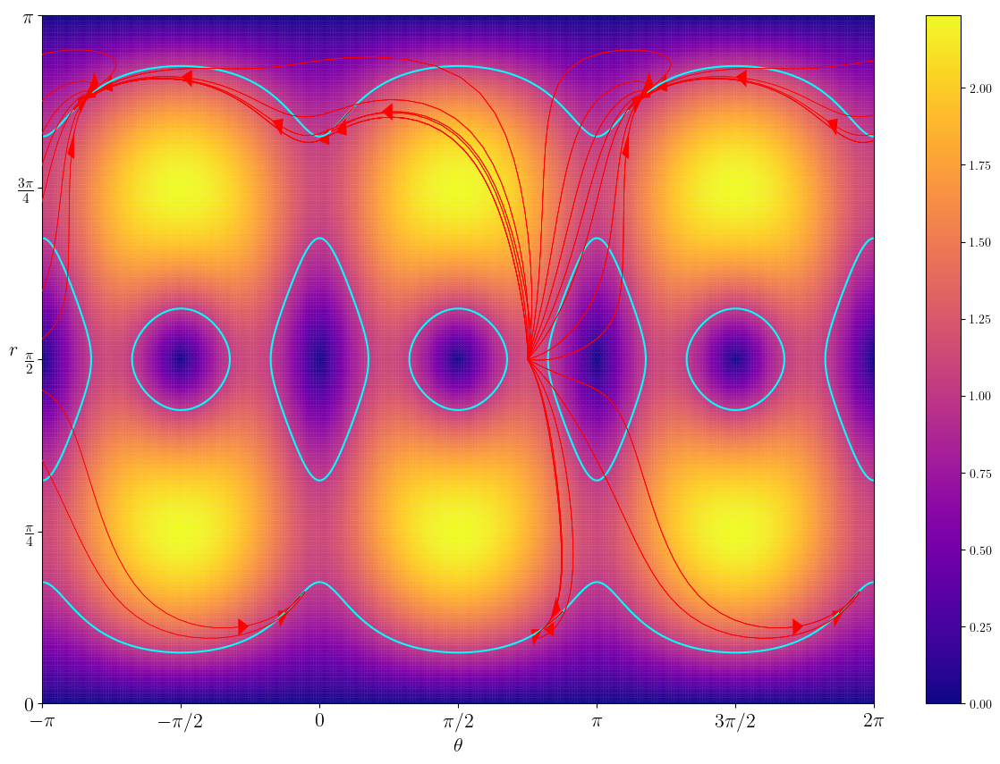

In [12]:
fig, ax = plot_F_contour(γ1, γ2, γ3, α)

αspan = np.linspace(0, 2*np.pi, 20)
tf = 3*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, color=color_hyperbolic_2D, figure=fig)
pass

In [13]:
# on cherche les anormales

def μ1_fun(r, θ, γ1, γ2, γ3, α):
    γ23 = γ2 - γ3
    cr = np.cos(r)
    sr = np.sin(r)
    ct = np.cos(θ)
    st = np.sin(θ)
    return α*γ1*cr*sr+γ23*ct*st*sr-α*(γ2*ct**2+γ3*st**2)*cr*sr

def μ2_fun(r, θ, γ1, γ2, γ3, α):
    γ23 = γ2 - γ3
    cr = np.cos(r)
    sr = np.sin(r)
    ct = np.cos(θ)
    st = np.sin(θ)
    return α*γ23*ct*st-γ1*cr+(γ3*st**2+γ2*ct**2)*cr

μ1 = μ1_fun(r0, θ0, γ1, γ2, γ3, α)
μ2 = μ2_fun(r0, θ0, γ1, γ2, γ3, α)
m2 = m2_fun(r0)

a = μ1**2+μ2**2*m2
b = 2*μ1
c = 1-m2*μ2*µ2

Δ = b**2-4*a*c

print(Δ)

pr_1 = (-b-np.sqrt(Δ))/(2*a)
pr_2 = (-b+np.sqrt(Δ))/(2*a)

print(pr_1)
print(pr_2)

pθ_1_1 =  np.sqrt(m2*(1-pr_1**2))
pθ_1_2 = -np.sqrt(m2*(1-pr_1**2))
pθ_2_1 =  np.sqrt(m2*(1-pr_2**2))
pθ_2_2 = -np.sqrt(m2*(1-pr_2**2))

print(pθ_1_1)
print(pθ_1_2)
print(pθ_2_1)
print(pθ_2_2)

def H_init(pr, pθ, μ1, μ2):
    return pr*μ1 + pθ*μ2 + 1

H_1_1 = H_init(pr_1, pθ_1_1, μ1, μ2)
H_1_2 = H_init(pr_1, pθ_1_2, μ1, μ2)
H_2_1 = H_init(pr_2, pθ_2_1, μ1, μ2)
H_2_2 = H_init(pr_2, pθ_2_2, μ1, μ2)

print(H_1_1)
print(H_1_2)
print(H_2_1)
print(H_2_2)

0.9999999999999991
-0.7999999999999998
0.0
0.6000000000000003
-0.6000000000000003
1.0
-1.0
1.2000000000000006
0.0
2.0
0.0


In [14]:
# anormales

pr_a_1 = pr_1
if np.abs(H_1_1) < np.abs(H_1_2):
    pθ_a_1 = pθ_1_1
else:
    pθ_a_1 = pθ_1_2

pr_a_2 = pr_2
if np.abs(H_2_1) < np.abs(H_2_2):
    pθ_a_2 = pθ_2_1
else:
    pθ_a_2 = pθ_2_2

# pr = sin(α)*sqrt(g1)
# pθ = cos(α)*sqrt(g2)

α_a_1  = math.atan2( pr_a_1, pθ_a_1/np.sqrt(m2))
p0_a_1 = prob.covector(np.array([r0, θ0]), α_a_1)

print([pr_a_1, pθ_a_1])
print(p0_a_1)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_1))

α_a_2  = math.atan2( pr_a_2, pθ_a_2/np.sqrt(m2))
p0_a_2 = prob.covector(np.array([r0, θ0]), α_a_2)

print()
print([pr_a_2, pθ_a_2])
print(p0_a_2)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_2))

[-0.7999999999999998, -0.6000000000000003]
[-0.8 -0.6]
0.0

[0.0, -1.0]
[ 1.2246468e-16 -1.0000000e+00]
1.1102230246251565e-16


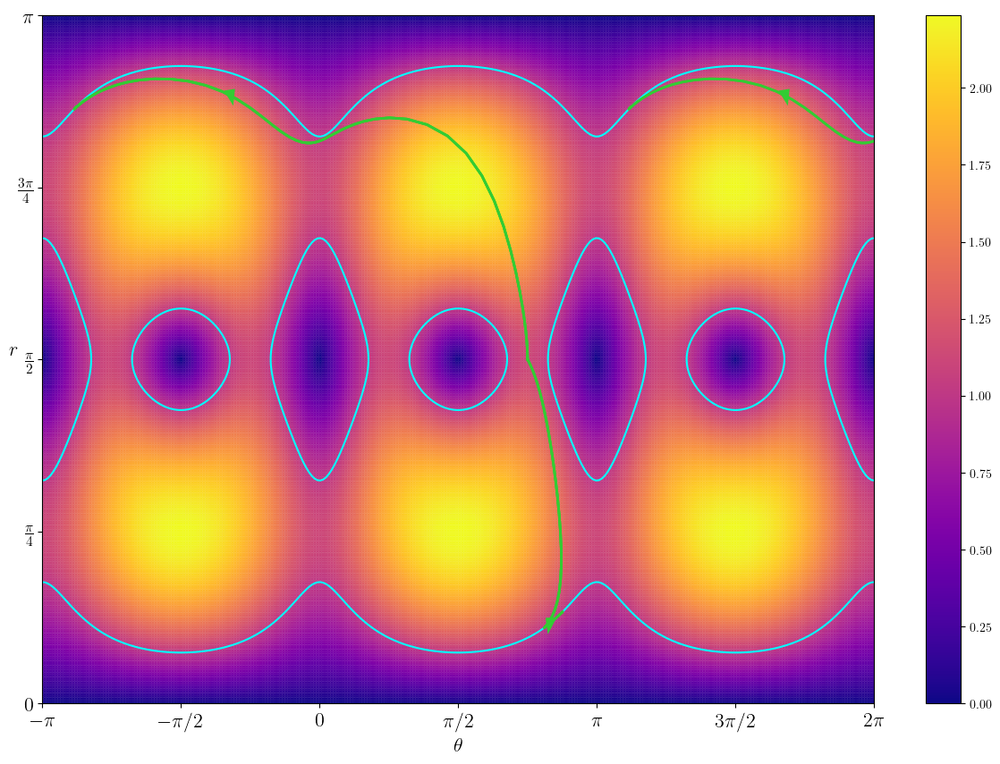

In [15]:
LW_GEO = 2.0

fig, ax = plot_F_contour(γ1, γ2, γ3, α);

αspan = [α_a_1, α_a_2]
tf = 5*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, linewidth=LW_GEO, color=color_abnormal_2D, figure=fig, force=True)
pass

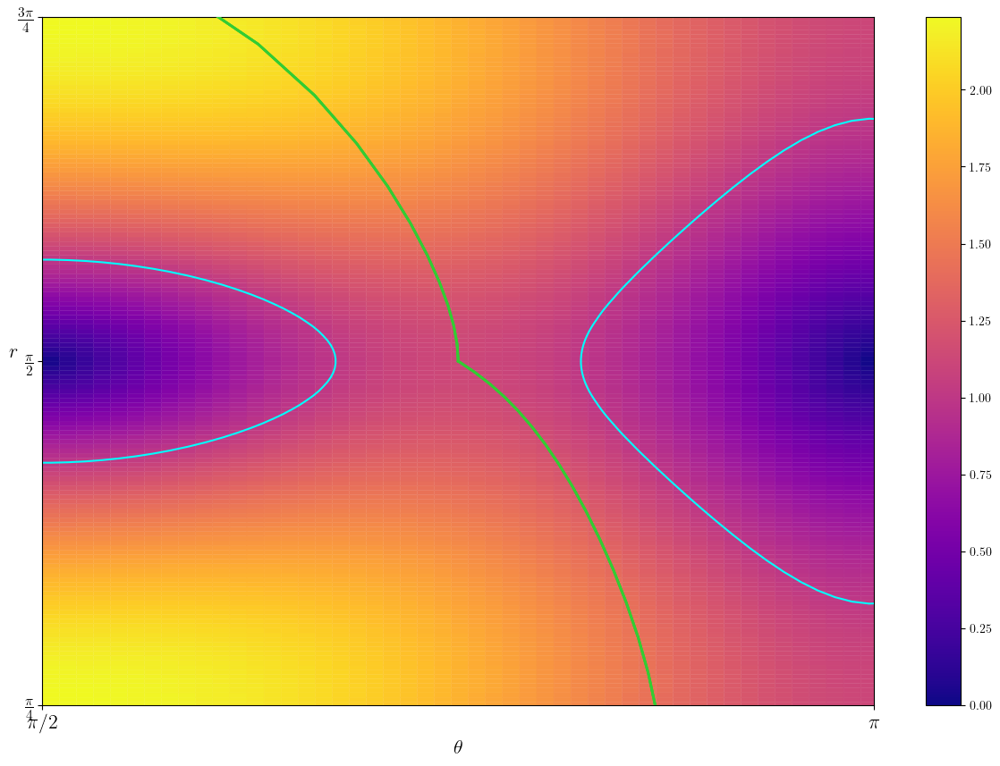

In [16]:
offset = np.pi/2
ax.set_xlim(np.pi/2, np.pi)
ax.set_ylim(np.pi/4-offset, 3*np.pi/4-offset)
fig

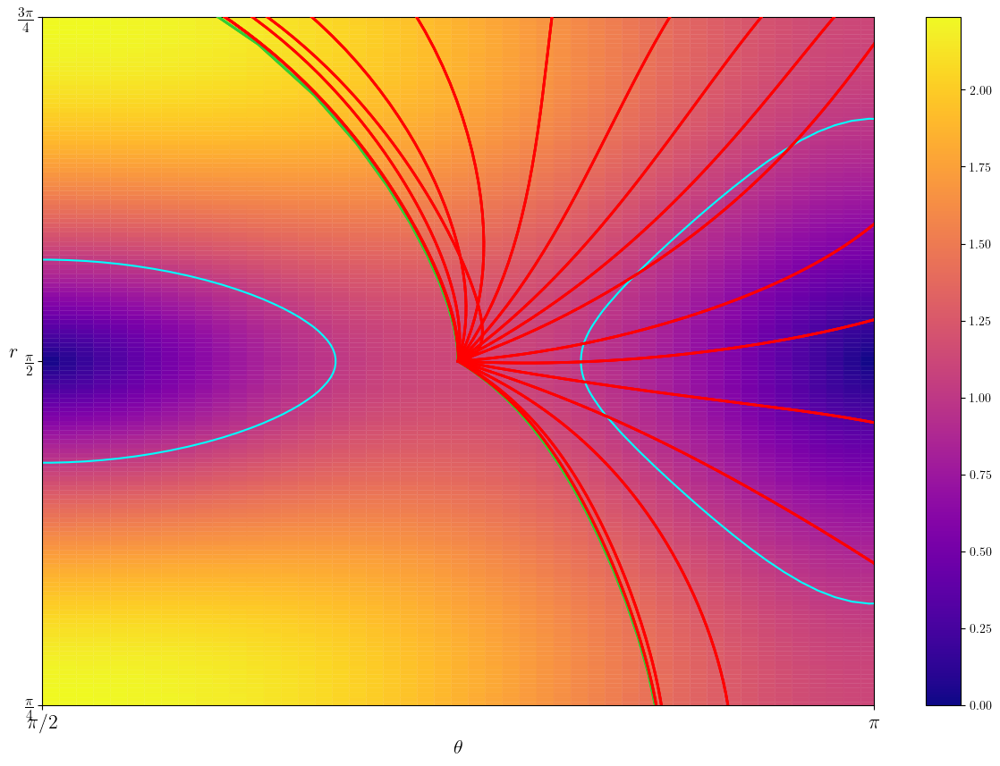

In [17]:
αspan = np.linspace(0, 2*np.pi, 20)
tf = 1*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, linewidth=LW_GEO, color=color_hyperbolic_2D, figure=fig, show_arrow=False)

## AUTRE POINT INITIAL

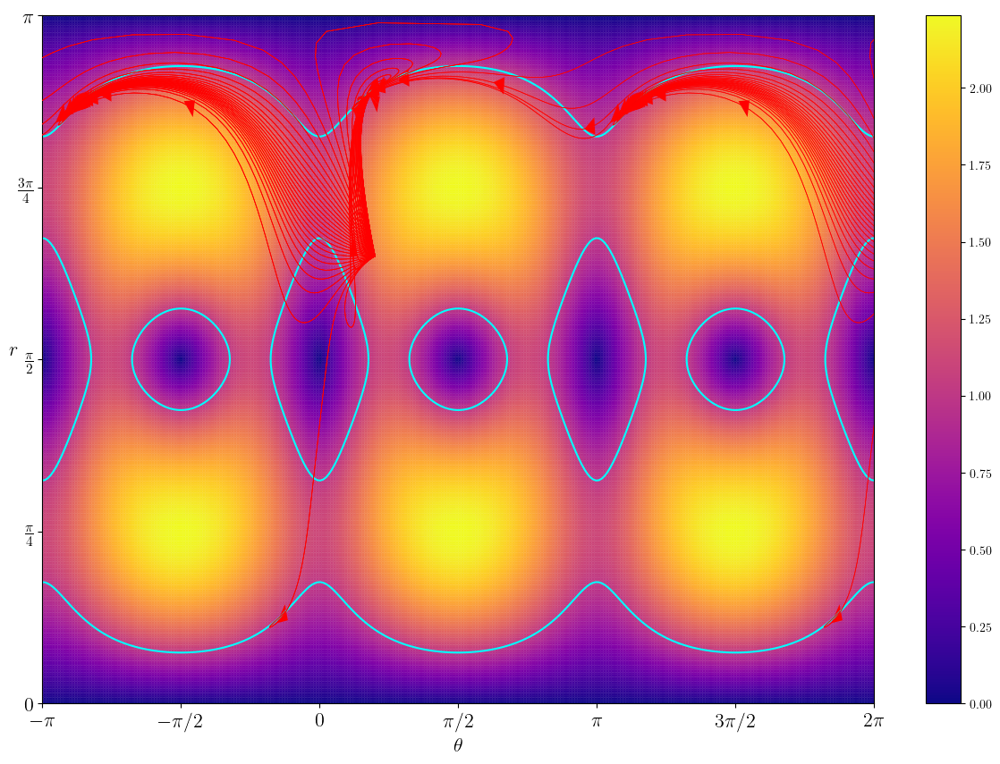

In [18]:
l1 = 0.2
θ0 = (1-l1)*0.0+l1*np.pi
l2 = 0.3
r0 = (1-l2)*np.pi/2.0+l2*np.pi
prob = initialize(θ0, r0, γ1, γ2, γ3, α)
geodesic = geometry2d.geodesic.Geodesic(prob)
# --------------------------------------------------
fig, ax = plot_F_contour(γ1, γ2, γ3, α)
αspan = np.linspace(0, 2*np.pi, 50)
tf = 3*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, color=color_hyperbolic_2D, figure=fig)
pass

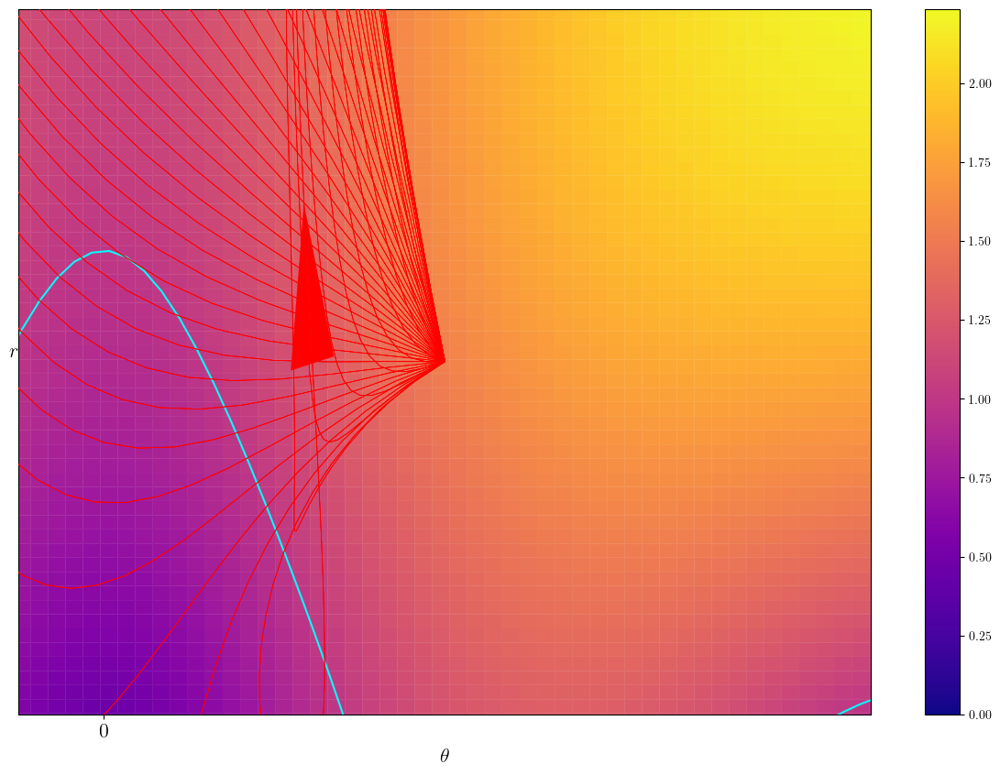

In [19]:
offset = np.pi/2
gap = np.pi/4
ax.set_xlim(θ0-gap, θ0+gap)
ax.set_ylim(r0-gap/3.0-offset, r0+gap/3.0-offset)
fig

-2.220446049250313e-16
0.0


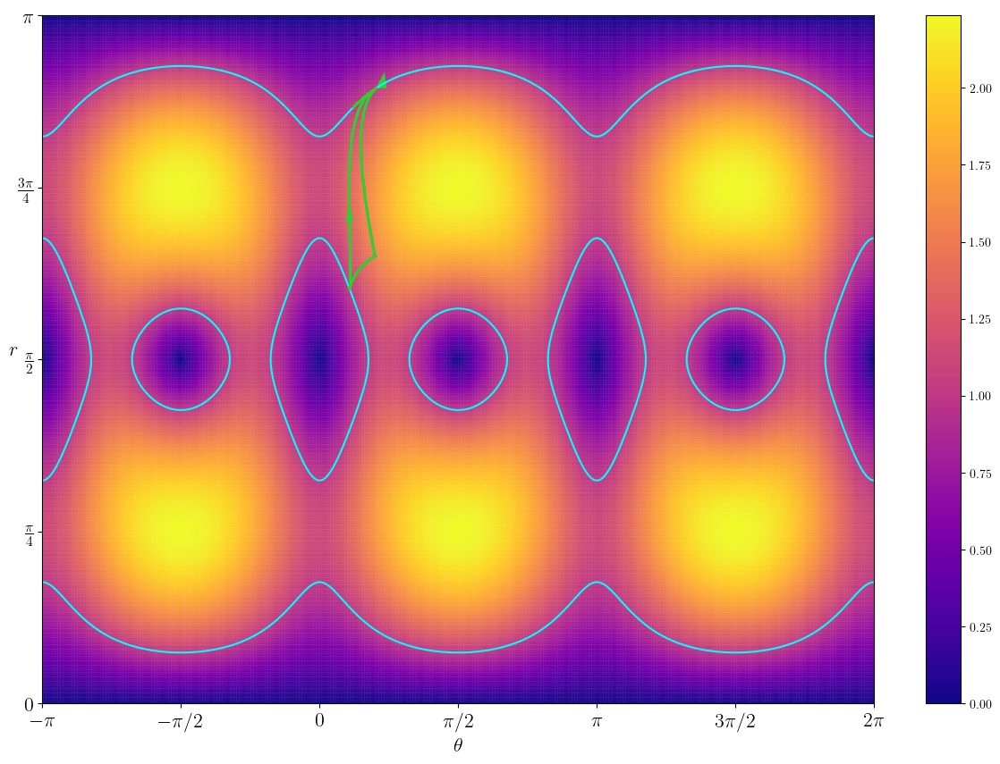

In [20]:
μ1 = μ1_fun(r0, θ0, γ1, γ2, γ3, α)
μ2 = μ2_fun(r0, θ0, γ1, γ2, γ3, α)
m2 = m2_fun(r0)

a = μ1**2+μ2**2*m2
b = 2*μ1
c = 1-m2*μ2*µ2

Δ = b**2-4*a*c

pr_1 = (-b-np.sqrt(Δ))/(2*a)
pr_2 = (-b+np.sqrt(Δ))/(2*a)

pθ_1_1 =  np.sqrt(m2*(1-pr_1**2))
pθ_1_2 = -np.sqrt(m2*(1-pr_1**2))
pθ_2_1 =  np.sqrt(m2*(1-pr_2**2))
pθ_2_2 = -np.sqrt(m2*(1-pr_2**2))

H_1_1 = H_init(pr_1, pθ_1_1, μ1, μ2)
H_1_2 = H_init(pr_1, pθ_1_2, μ1, μ2)
H_2_1 = H_init(pr_2, pθ_2_1, μ1, μ2)
H_2_2 = H_init(pr_2, pθ_2_2, μ1, μ2)

# anormales
pr_a_1 = pr_1
if np.abs(H_1_1) < np.abs(H_1_2):
    pθ_a_1 = pθ_1_1
else:
    pθ_a_1 = pθ_1_2

pr_a_2 = pr_2
if np.abs(H_2_1) < np.abs(H_2_2):
    pθ_a_2 = pθ_2_1
else:
    pθ_a_2 = pθ_2_2

# pr = sin(α)*sqrt(g1)
# pθ = cos(α)*sqrt(g2)
α_a_1  = math.atan2( pr_a_1, pθ_a_1/np.sqrt(m2))
p0_a_1 = prob.covector(np.array([r0, θ0]), α_a_1)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_1))

α_a_2  = math.atan2( pr_a_2, pθ_a_2/np.sqrt(m2))
p0_a_2 = prob.covector(np.array([r0, θ0]), α_a_2)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_2))

# FIGURE
LW_GEO = 2.0

fig, ax = plot_F_contour(γ1, γ2, γ3, α);

αspan = [α_a_1, α_a_2]
tf = 2*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, linewidth=LW_GEO, color=color_abnormal_2D, figure=fig, force=True)
pass

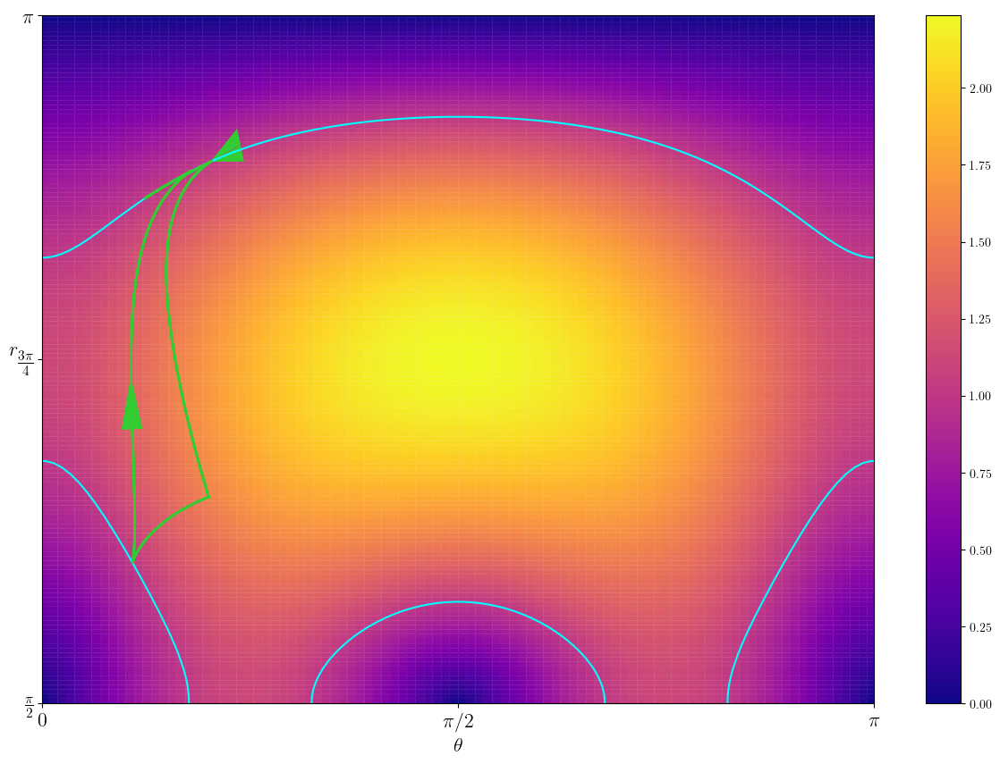

In [21]:
offset = np.pi/2
ax.set_xlim(0, np.pi)
ax.set_ylim(np.pi/2-offset, np.pi-offset)
fig

## AUTRE POINT INITIAL

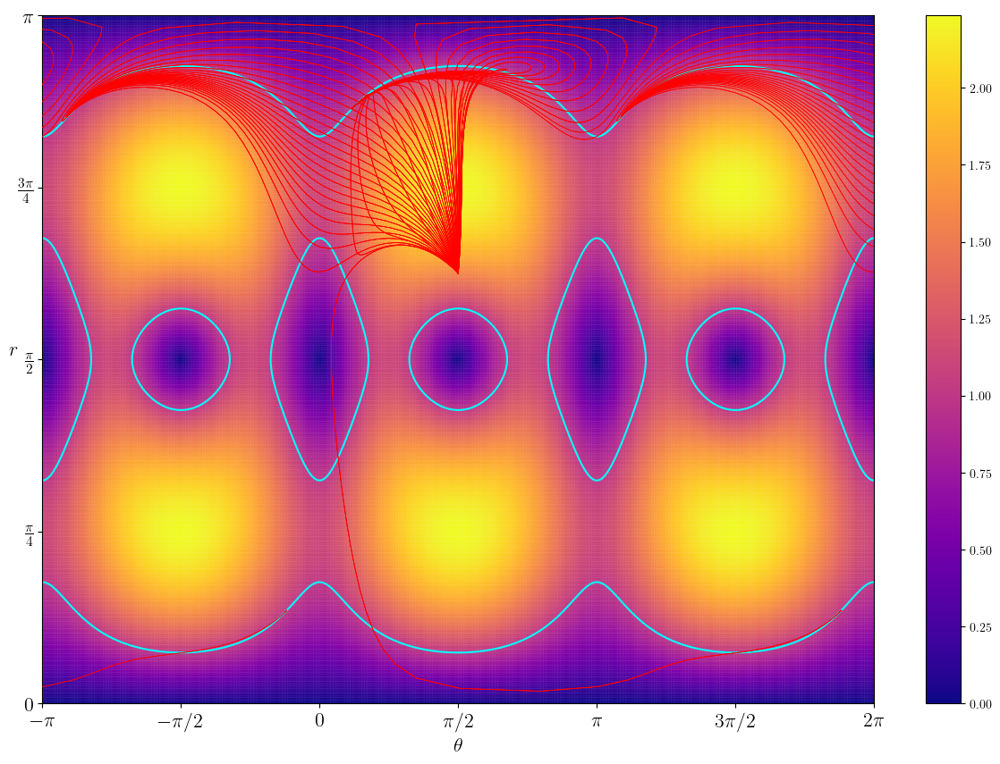

In [40]:
l1 = 0.5
θ0 = (1-l1)*0.0+l1*np.pi
l2 = 0.17
l2 = 0.25
r0 = (1-l2)*np.pi/2.0+l2*np.pi
prob = initialize(θ0, r0, γ1, γ2, γ3, α)
geodesic = geometry2d.geodesic.Geodesic(prob)
# --------------------------------------------------
fig, ax = plot_F_contour(γ1, γ2, γ3, α)
αspan = np.linspace(0, 2*np.pi, 50)
tf = 3*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, color=color_hyperbolic_2D, figure=fig, show_arrow=False)
pass

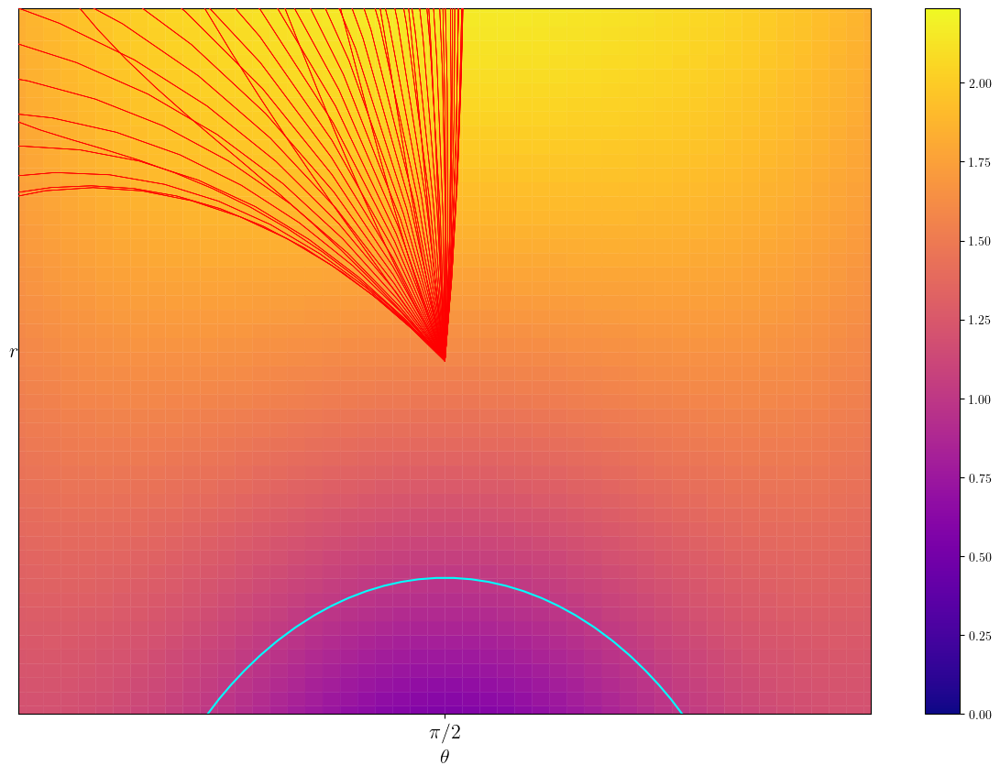

In [41]:
offset = np.pi/2
gap = np.pi/4
ax.set_xlim(θ0-gap, θ0+gap)
ax.set_ylim(r0-gap/3.0-offset, r0+gap/3.0-offset)
fig

6.661338147750939e-16
-1.1102230246251565e-16


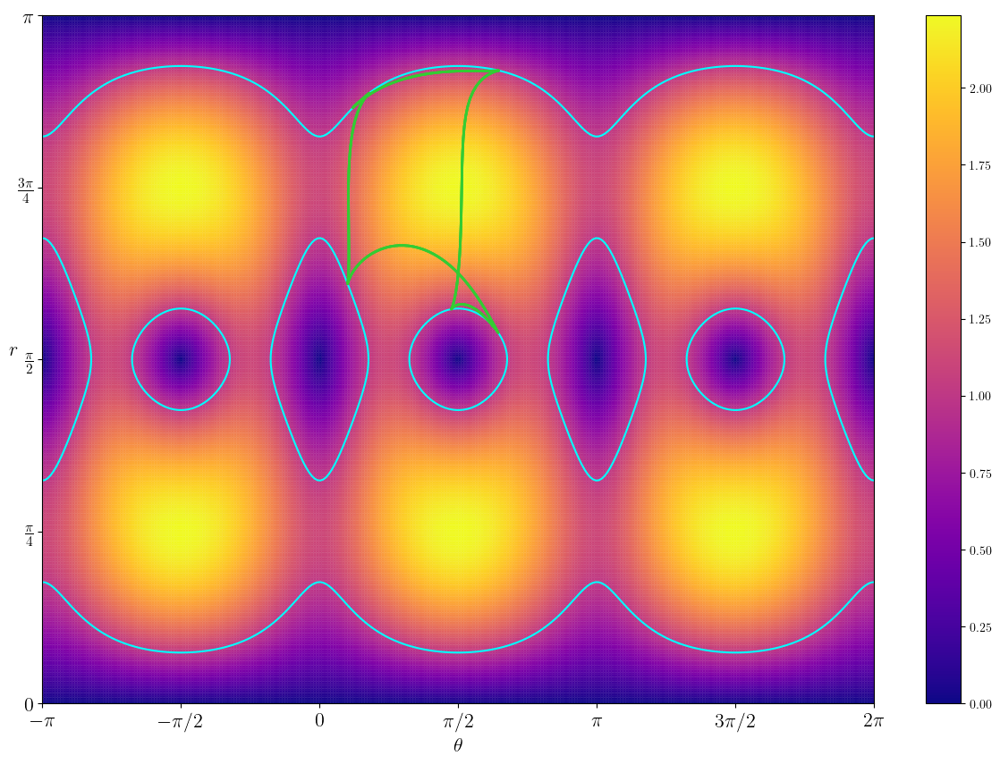

In [42]:
μ1 = μ1_fun(r0, θ0, γ1, γ2, γ3, α)
μ2 = μ2_fun(r0, θ0, γ1, γ2, γ3, α)
m2 = m2_fun(r0)

a = μ1**2+μ2**2*m2
b = 2*μ1
c = 1-m2*μ2*µ2

Δ = b**2-4*a*c

pr_1 = (-b-np.sqrt(Δ))/(2*a)
pr_2 = (-b+np.sqrt(Δ))/(2*a)

pθ_1_1 =  np.sqrt(m2*(1-pr_1**2))
pθ_1_2 = -np.sqrt(m2*(1-pr_1**2))
pθ_2_1 =  np.sqrt(m2*(1-pr_2**2))
pθ_2_2 = -np.sqrt(m2*(1-pr_2**2))

H_1_1 = H_init(pr_1, pθ_1_1, μ1, μ2)
H_1_2 = H_init(pr_1, pθ_1_2, μ1, μ2)
H_2_1 = H_init(pr_2, pθ_2_1, μ1, μ2)
H_2_2 = H_init(pr_2, pθ_2_2, μ1, μ2)

# anormales
pr_a_1 = pr_1
if np.abs(H_1_1) < np.abs(H_1_2):
    pθ_a_1 = pθ_1_1
else:
    pθ_a_1 = pθ_1_2

pr_a_2 = pr_2
if np.abs(H_2_1) < np.abs(H_2_2):
    pθ_a_2 = pθ_2_1
else:
    pθ_a_2 = pθ_2_2

# pr = sin(α)*sqrt(g1)
# pθ = cos(α)*sqrt(g2)
α_a_1  = math.atan2( pr_a_1, pθ_a_1/np.sqrt(m2))
p0_a_1 = prob.covector(np.array([r0, θ0]), α_a_1)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_1))

α_a_2  = math.atan2( pr_a_2, pθ_a_2/np.sqrt(m2))
p0_a_2 = prob.covector(np.array([r0, θ0]), α_a_2)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_2))

# FIGURE
LW_GEO = 2.0

fig, ax = plot_F_contour(γ1, γ2, γ3, α);

αspan = [α_a_1, α_a_2]
tf = 2*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, linewidth=LW_GEO, color=color_abnormal_2D, figure=fig, force=True, show_arrow=False)
geodesic.plot(alphas=αspan, tf=-tf, view=PLANE, linewidth=LW_GEO, color=color_abnormal_2D, figure=fig, force=True, show_arrow=False)
pass

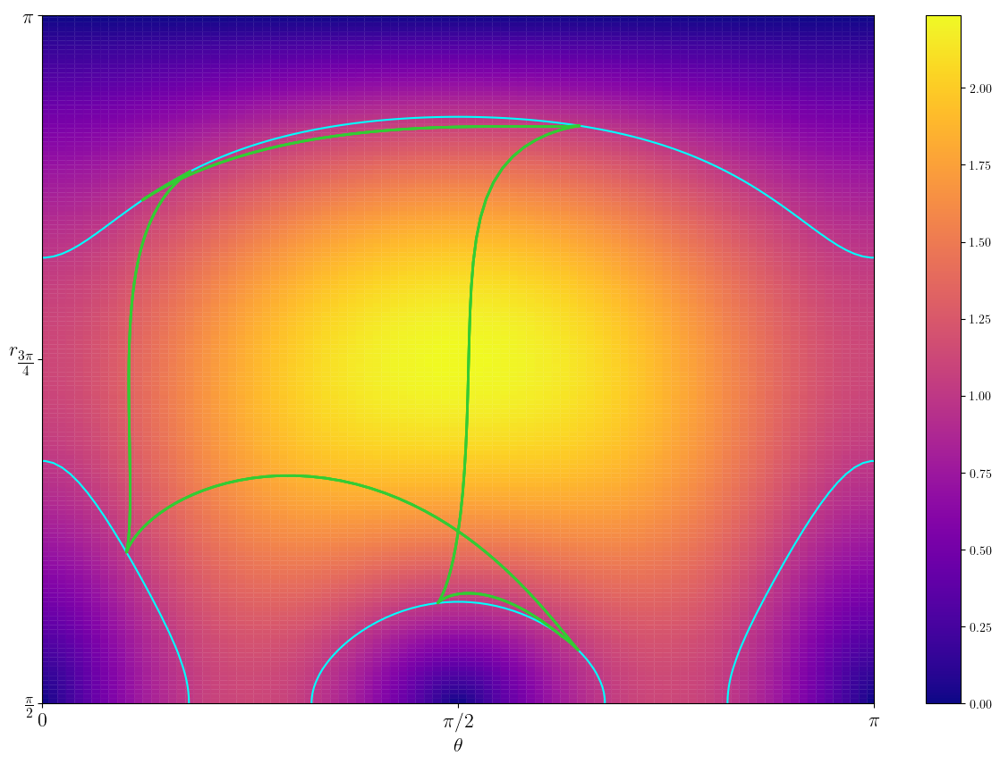

In [43]:
offset = np.pi/2
ax.set_xlim(0, np.pi)
ax.set_ylim(np.pi/2-offset, np.pi-offset)
fig

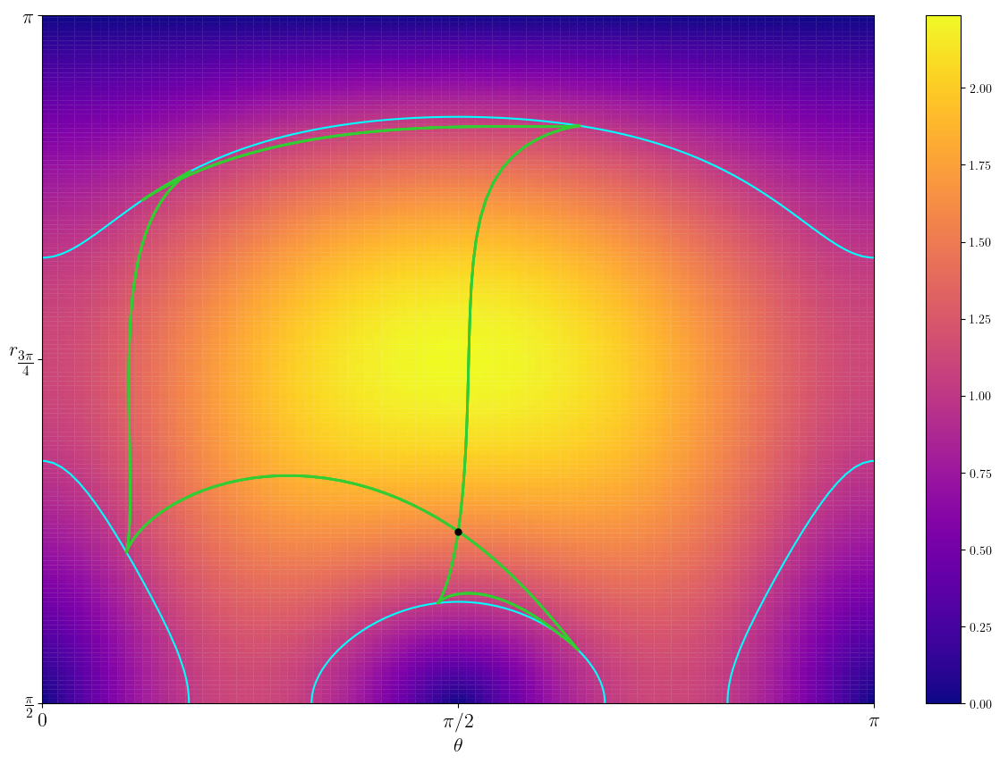

In [44]:
# add q0
z_order_q0=106
r = r0
θ = θ0
φ = r - np.pi/2
ax.plot(θ, φ, marker="o", markersize=5, markeredgecolor="black", markerfacecolor="black", zorder=z_order_q0)  
ax.plot(θ+2*np.pi, φ, marker="o", markersize=5, markeredgecolor="black", markerfacecolor="black", zorder=z_order_q0)  
ax.plot(θ-2*np.pi, φ, marker="o", markersize=5, markeredgecolor="black", markerfacecolor="black", zorder=z_order_q0)

# lims
offset = np.pi/2
ax.set_xlim(0, np.pi)
ax.set_ylim(np.pi/2-offset, np.pi-offset)

#
fig.savefig('landau_billiard.pdf', dpi=300, transparent=True, format="pdf", bbox_inches='tight')

fig

# CAS DIFFERENT

In [26]:
γ1 = 1.0
γ2 = 2.0
α  = 2.0
γ3 = γ2 + 2/(np.sqrt(1+α**2))

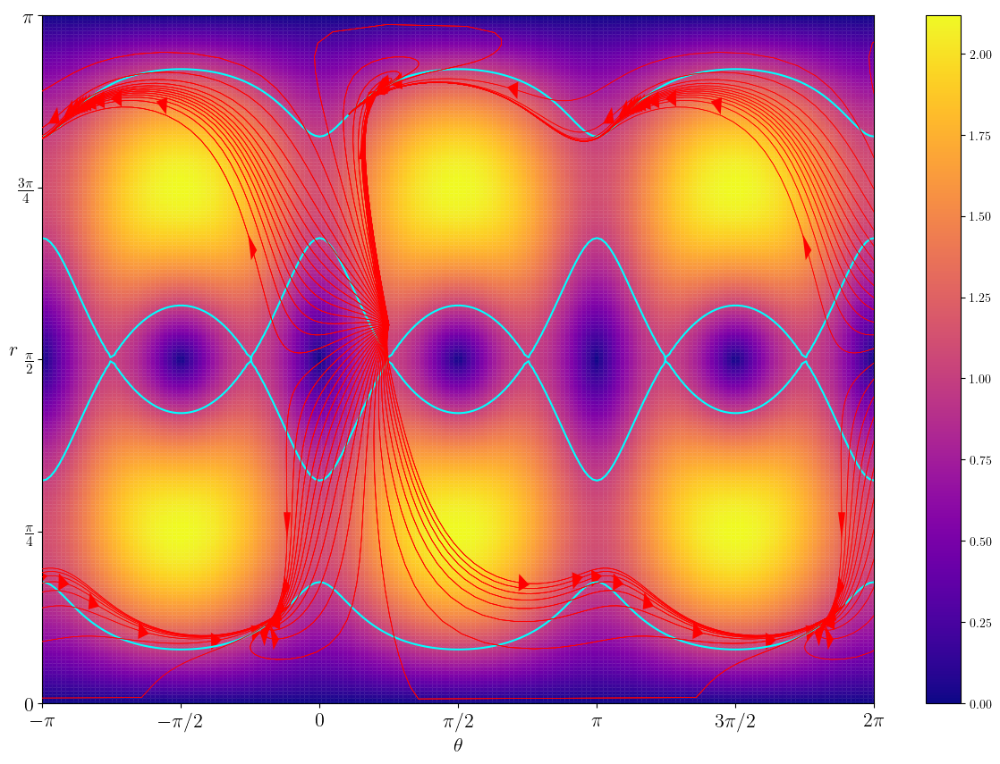

In [27]:
l1 = 0.25
θ0 = (1-l1)*0.0+l1*np.pi
l2 = 0.1
r0 = (1-l2)*np.pi/2.0+l2*np.pi
prob = initialize(θ0, r0, γ1, γ2, γ3, α)
geodesic = geometry2d.geodesic.Geodesic(prob)
# --------------------------------------------------
fig, ax = plot_F_contour(γ1, γ2, γ3, α)
αspan = np.linspace(0, 2*np.pi, 50)
tf = 3*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, color=color_hyperbolic_2D, figure=fig)
pass

0.0
0.0


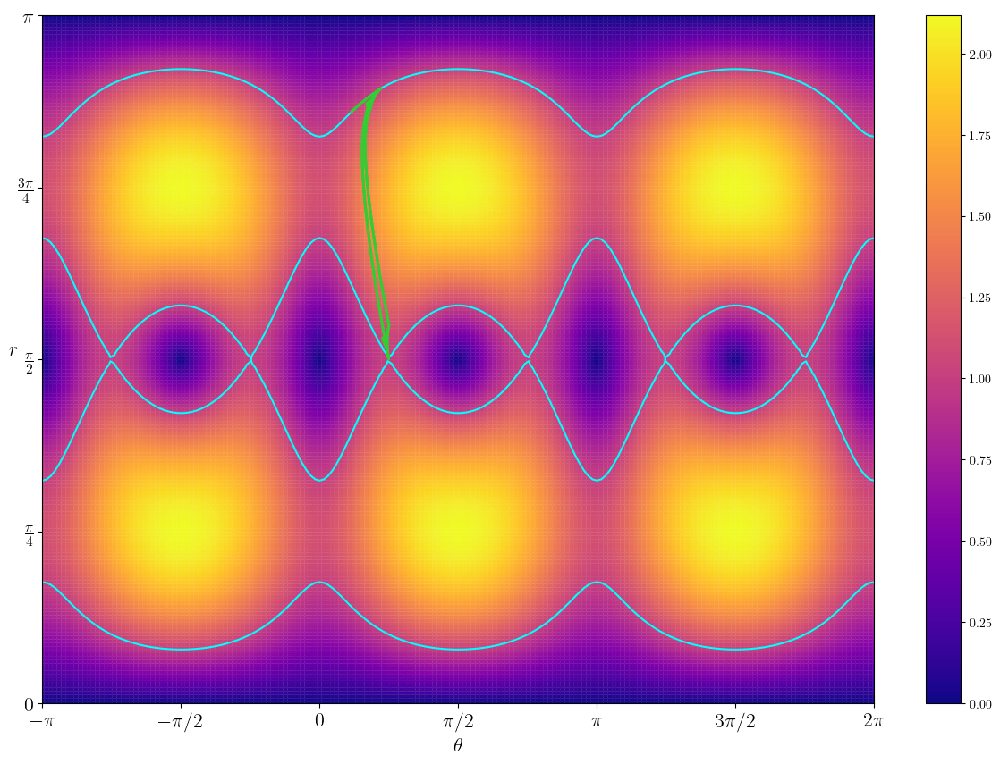

In [28]:
μ1 = μ1_fun(r0, θ0, γ1, γ2, γ3, α)
μ2 = μ2_fun(r0, θ0, γ1, γ2, γ3, α)
m2 = m2_fun(r0)

a = μ1**2+μ2**2*m2
b = 2*μ1
c = 1-m2*μ2*µ2

Δ = b**2-4*a*c

pr_1 = (-b-np.sqrt(Δ))/(2*a)
pr_2 = (-b+np.sqrt(Δ))/(2*a)

pθ_1_1 =  np.sqrt(m2*(1-pr_1**2))
pθ_1_2 = -np.sqrt(m2*(1-pr_1**2))
pθ_2_1 =  np.sqrt(m2*(1-pr_2**2))
pθ_2_2 = -np.sqrt(m2*(1-pr_2**2))

H_1_1 = H_init(pr_1, pθ_1_1, μ1, μ2)
H_1_2 = H_init(pr_1, pθ_1_2, μ1, μ2)
H_2_1 = H_init(pr_2, pθ_2_1, μ1, μ2)
H_2_2 = H_init(pr_2, pθ_2_2, μ1, μ2)

# anormales
pr_a_1 = pr_1
if np.abs(H_1_1) < np.abs(H_1_2):
    pθ_a_1 = pθ_1_1
else:
    pθ_a_1 = pθ_1_2

pr_a_2 = pr_2
if np.abs(H_2_1) < np.abs(H_2_2):
    pθ_a_2 = pθ_2_1
else:
    pθ_a_2 = pθ_2_2

# pr = sin(α)*sqrt(g1)
# pθ = cos(α)*sqrt(g2)
α_a_1  = math.atan2( pr_a_1, pθ_a_1/np.sqrt(m2))
p0_a_1 = prob.covector(np.array([r0, θ0]), α_a_1)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_1))

α_a_2  = math.atan2( pr_a_2, pθ_a_2/np.sqrt(m2))
p0_a_2 = prob.covector(np.array([r0, θ0]), α_a_2)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_2))

# FIGURE
LW_GEO = 2.0

fig, ax = plot_F_contour(γ1, γ2, γ3, α);

αspan = [α_a_1, α_a_2]
tf = 2*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, linewidth=LW_GEO, color=color_abnormal_2D, figure=fig, force=True)
pass

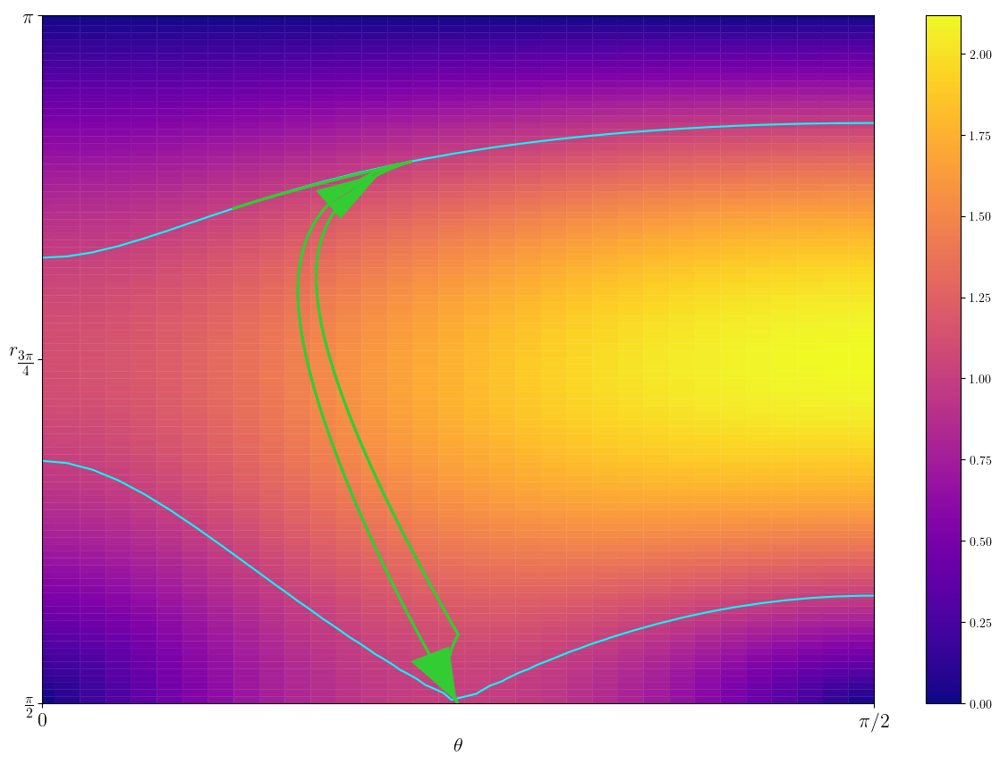

In [29]:
offset = np.pi/2
ax.set_xlim(0, np.pi/2)
ax.set_ylim(np.pi/2-offset, np.pi-offset)
fig

## AUTRE POINT INITIAL

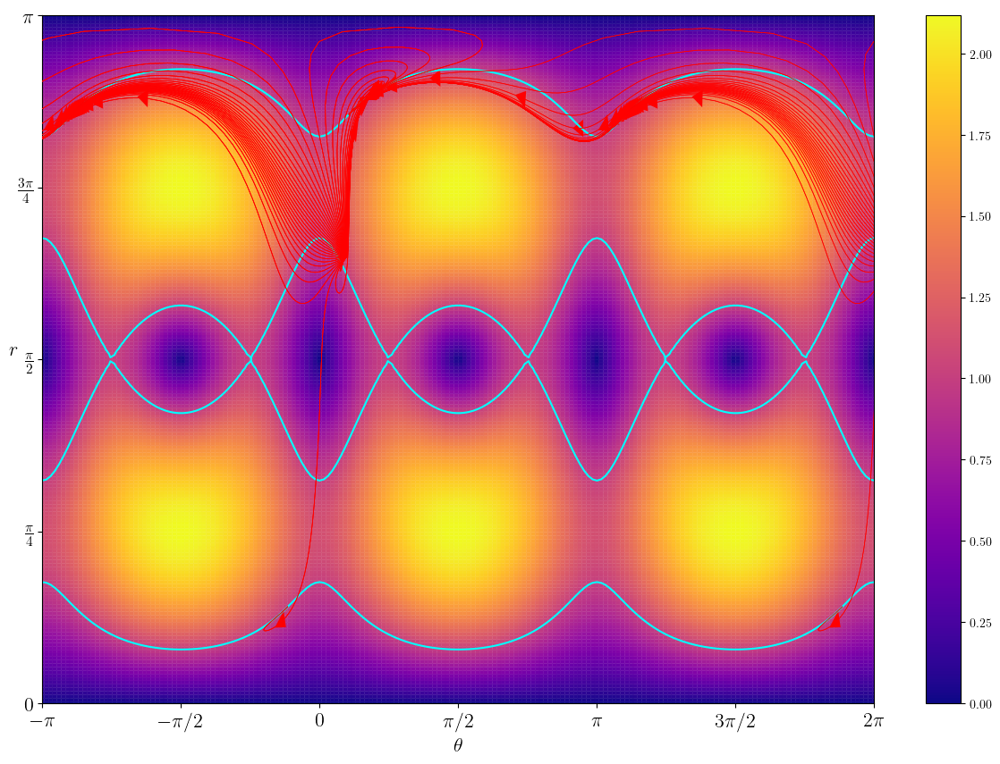

In [30]:
l1 = 0.1
θ0 = (1-l1)*0.0+l1*np.pi
l2 = 0.3
r0 = (1-l2)*np.pi/2.0+l2*np.pi
prob = initialize(θ0, r0, γ1, γ2, γ3, α)
geodesic = geometry2d.geodesic.Geodesic(prob)
# --------------------------------------------------
fig, ax = plot_F_contour(γ1, γ2, γ3, α)
αspan = np.linspace(0, 2*np.pi, 50)
tf = 3*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, color=color_hyperbolic_2D, figure=fig)
pass

0.0
-1.1102230246251565e-16


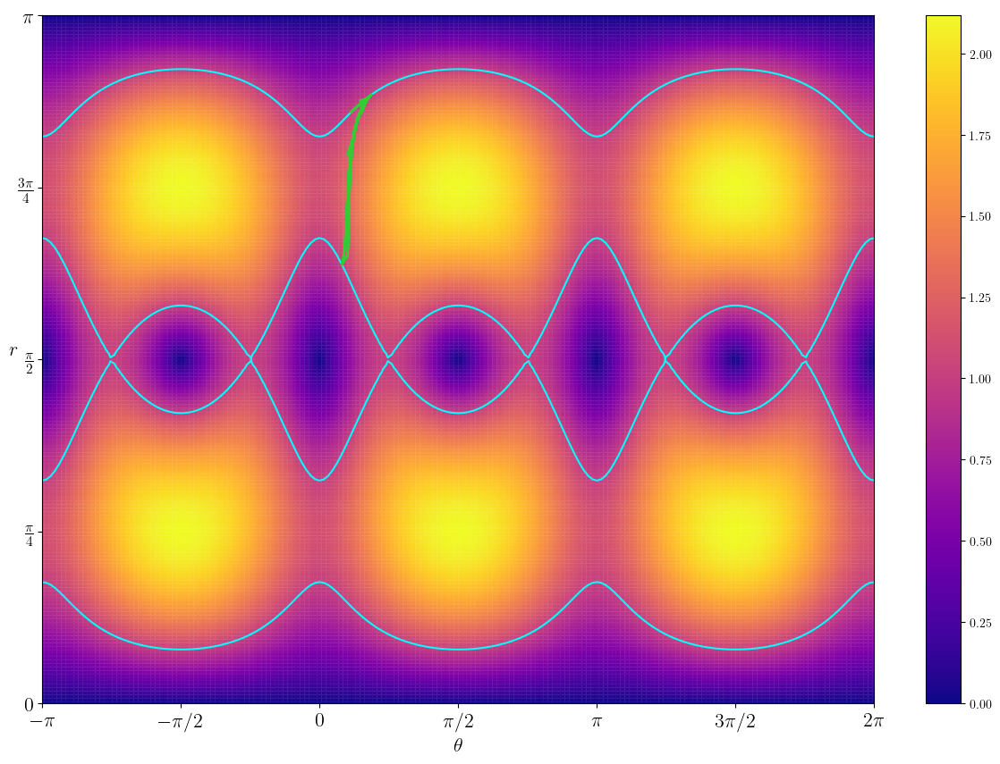

In [31]:
μ1 = μ1_fun(r0, θ0, γ1, γ2, γ3, α)
μ2 = μ2_fun(r0, θ0, γ1, γ2, γ3, α)
m2 = m2_fun(r0)

a = μ1**2+μ2**2*m2
b = 2*μ1
c = 1-m2*μ2*µ2

Δ = b**2-4*a*c

pr_1 = (-b-np.sqrt(Δ))/(2*a)
pr_2 = (-b+np.sqrt(Δ))/(2*a)

pθ_1_1 =  np.sqrt(m2*(1-pr_1**2))
pθ_1_2 = -np.sqrt(m2*(1-pr_1**2))
pθ_2_1 =  np.sqrt(m2*(1-pr_2**2))
pθ_2_2 = -np.sqrt(m2*(1-pr_2**2))

H_1_1 = H_init(pr_1, pθ_1_1, μ1, μ2)
H_1_2 = H_init(pr_1, pθ_1_2, μ1, μ2)
H_2_1 = H_init(pr_2, pθ_2_1, μ1, μ2)
H_2_2 = H_init(pr_2, pθ_2_2, μ1, μ2)

# anormales
pr_a_1 = pr_1
if np.abs(H_1_1) < np.abs(H_1_2):
    pθ_a_1 = pθ_1_1
else:
    pθ_a_1 = pθ_1_2

pr_a_2 = pr_2
if np.abs(H_2_1) < np.abs(H_2_2):
    pθ_a_2 = pθ_2_1
else:
    pθ_a_2 = pθ_2_2

# pr = sin(α)*sqrt(g1)
# pθ = cos(α)*sqrt(g2)
α_a_1  = math.atan2( pr_a_1, pθ_a_1/np.sqrt(m2))
p0_a_1 = prob.covector(np.array([r0, θ0]), α_a_1)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_1))

α_a_2  = math.atan2( pr_a_2, pθ_a_2/np.sqrt(m2))
p0_a_2 = prob.covector(np.array([r0, θ0]), α_a_2)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_2))

# FIGURE
LW_GEO = 2.0

fig, ax = plot_F_contour(γ1, γ2, γ3, α);

αspan = [α_a_1, α_a_2]
tf = 2*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, linewidth=LW_GEO, color=color_abnormal_2D, figure=fig, force=True)
pass

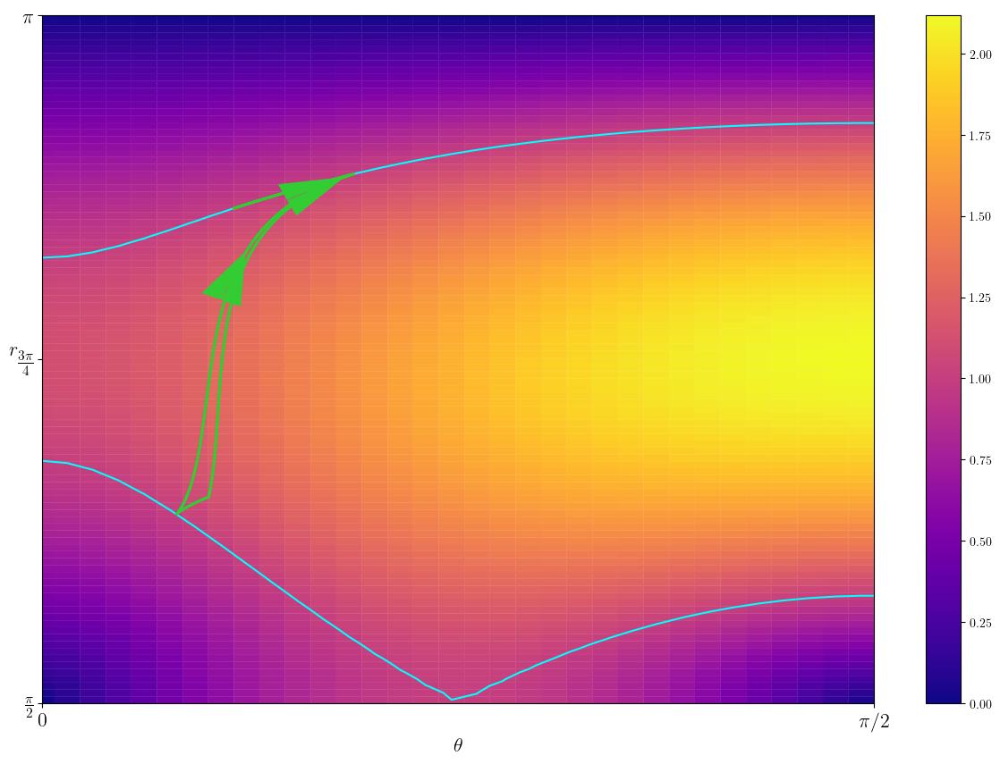

In [32]:
offset = np.pi/2
ax.set_xlim(0, np.pi/2)
ax.set_ylim(np.pi/2-offset, np.pi-offset)
fig

## AUTRE POINT INITIAL

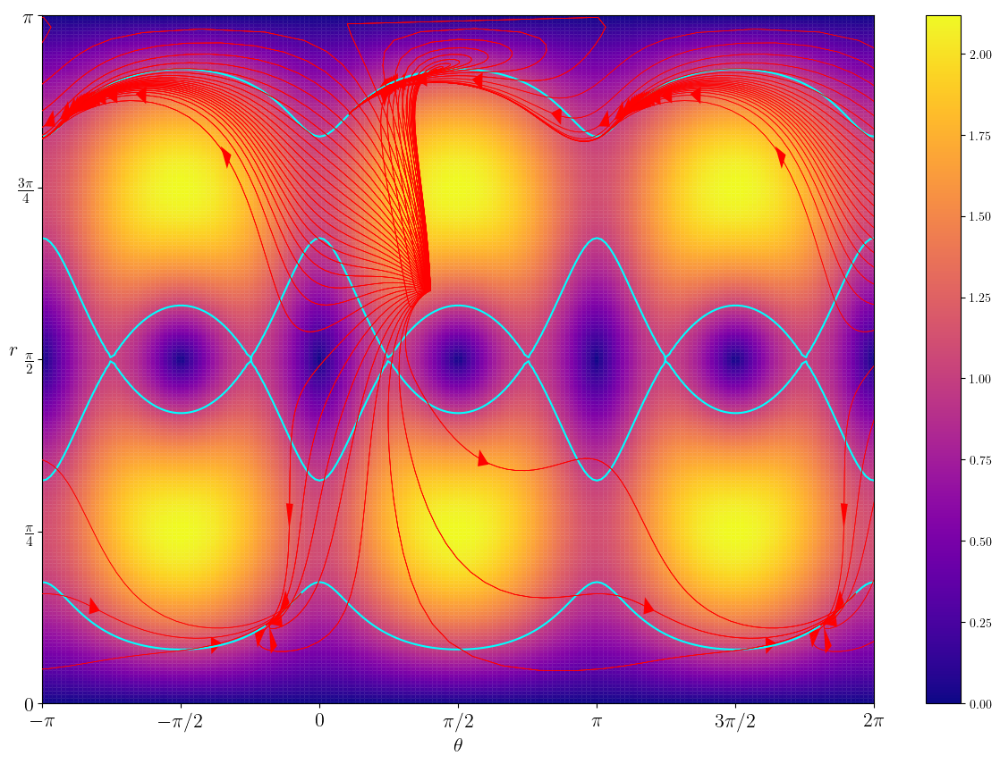

In [33]:
l1 = 0.4
θ0 = (1-l1)*0.0+l1*np.pi
l2 = 0.2
r0 = (1-l2)*np.pi/2.0+l2*np.pi
prob = initialize(θ0, r0, γ1, γ2, γ3, α)
geodesic = geometry2d.geodesic.Geodesic(prob)
# --------------------------------------------------
fig, ax = plot_F_contour(γ1, γ2, γ3, α)
αspan = np.linspace(0, 2*np.pi, 50)
tf = 3*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, color=color_hyperbolic_2D, figure=fig)
pass

-4.440892098500626e-16
0.0


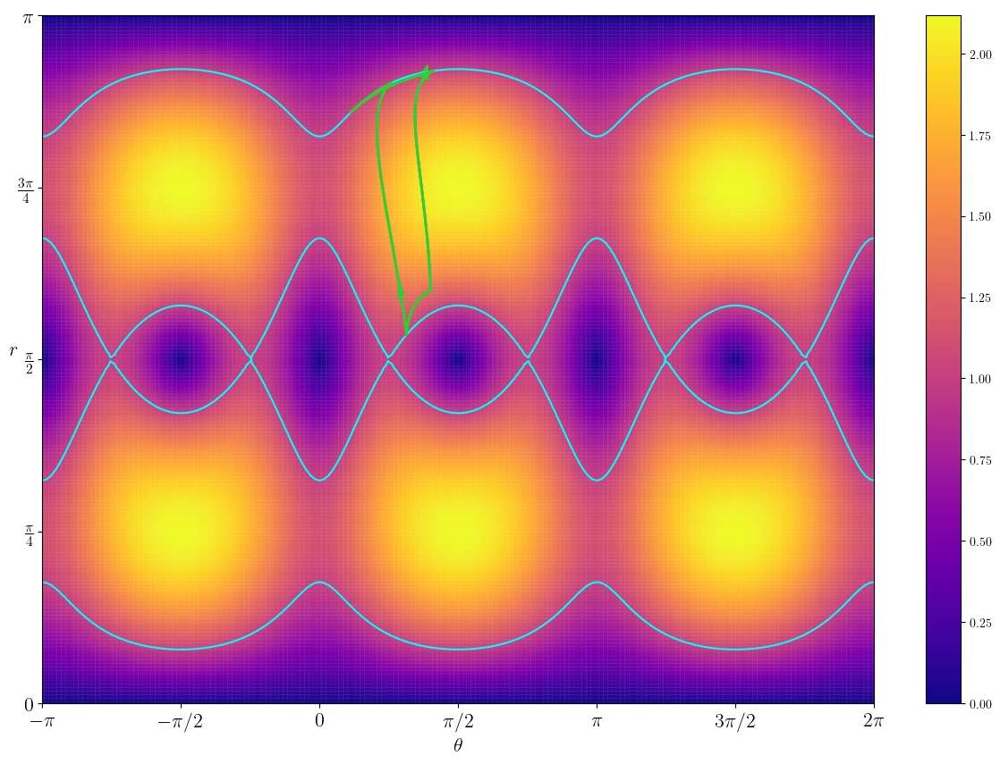

In [34]:
μ1 = μ1_fun(r0, θ0, γ1, γ2, γ3, α)
μ2 = μ2_fun(r0, θ0, γ1, γ2, γ3, α)
m2 = m2_fun(r0)

a = μ1**2+μ2**2*m2
b = 2*μ1
c = 1-m2*μ2*µ2

Δ = b**2-4*a*c

pr_1 = (-b-np.sqrt(Δ))/(2*a)
pr_2 = (-b+np.sqrt(Δ))/(2*a)

pθ_1_1 =  np.sqrt(m2*(1-pr_1**2))
pθ_1_2 = -np.sqrt(m2*(1-pr_1**2))
pθ_2_1 =  np.sqrt(m2*(1-pr_2**2))
pθ_2_2 = -np.sqrt(m2*(1-pr_2**2))

H_1_1 = H_init(pr_1, pθ_1_1, μ1, μ2)
H_1_2 = H_init(pr_1, pθ_1_2, μ1, μ2)
H_2_1 = H_init(pr_2, pθ_2_1, μ1, μ2)
H_2_2 = H_init(pr_2, pθ_2_2, μ1, μ2)

# anormales
pr_a_1 = pr_1
if np.abs(H_1_1) < np.abs(H_1_2):
    pθ_a_1 = pθ_1_1
else:
    pθ_a_1 = pθ_1_2

pr_a_2 = pr_2
if np.abs(H_2_1) < np.abs(H_2_2):
    pθ_a_2 = pθ_2_1
else:
    pθ_a_2 = pθ_2_2

# pr = sin(α)*sqrt(g1)
# pθ = cos(α)*sqrt(g2)
α_a_1  = math.atan2( pr_a_1, pθ_a_1/np.sqrt(m2))
p0_a_1 = prob.covector(np.array([r0, θ0]), α_a_1)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_1))

α_a_2  = math.atan2( pr_a_2, pθ_a_2/np.sqrt(m2))
p0_a_2 = prob.covector(np.array([r0, θ0]), α_a_2)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_2))

# FIGURE
LW_GEO = 2.0

fig, ax = plot_F_contour(γ1, γ2, γ3, α);

αspan = [α_a_1, α_a_2]
tf = 2*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, linewidth=LW_GEO, color=color_abnormal_2D, figure=fig, force=True)
pass

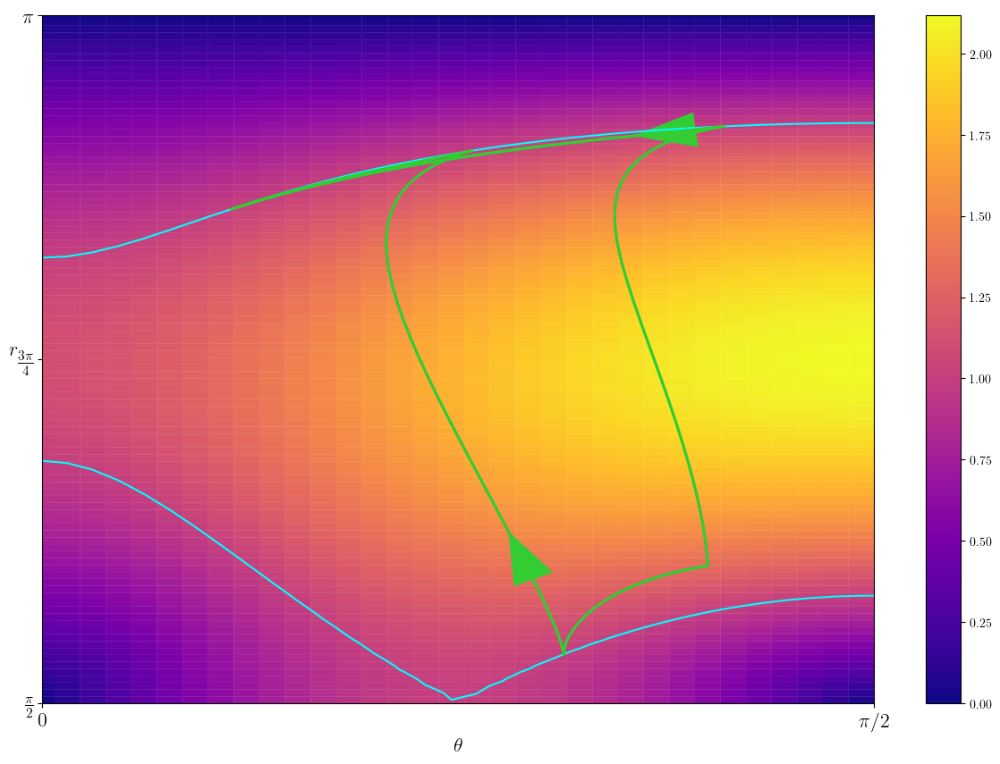

In [35]:
offset = np.pi/2
ax.set_xlim(0, np.pi/2)
ax.set_ylim(np.pi/2-offset, np.pi-offset)
fig

## Autre point initial

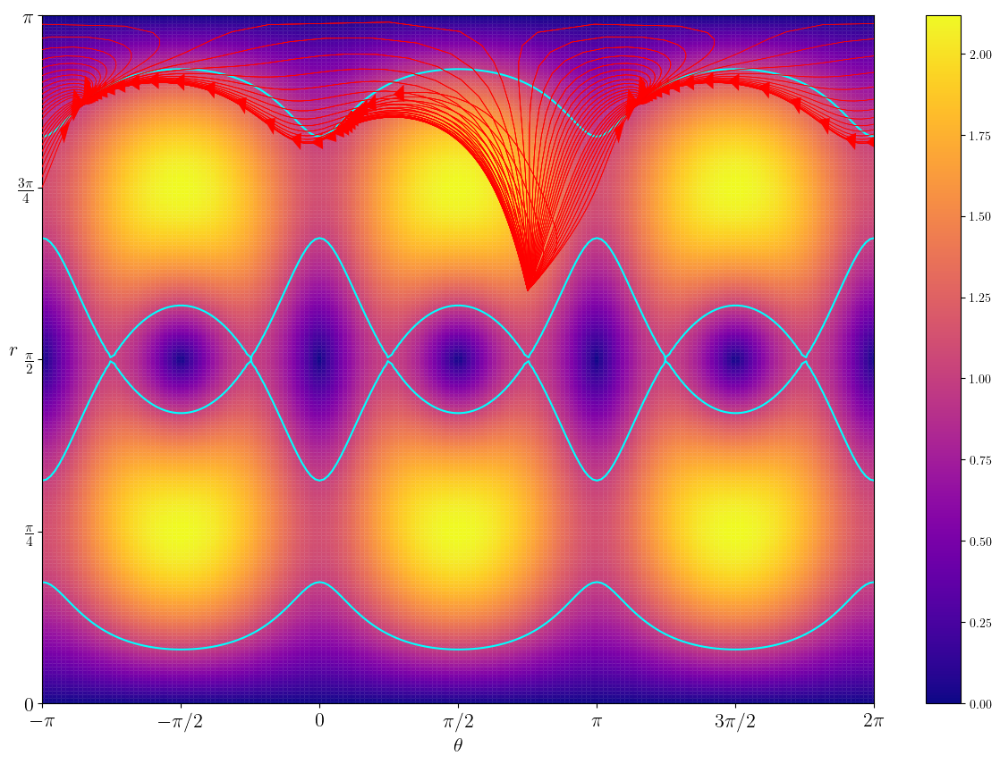

In [36]:
l1 = 0.75
θ0 = (1-l1)*0.0+l1*np.pi
l2 = 0.20
r0 = (1-l2)*np.pi/2.0+l2*np.pi
prob = initialize(θ0, r0, γ1, γ2, γ3, α)
geodesic = geometry2d.geodesic.Geodesic(prob)
# --------------------------------------------------
fig, ax = plot_F_contour(γ1, γ2, γ3, α)
αspan = np.linspace(0, 2*np.pi, 50)
tf = 3*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, color=color_hyperbolic_2D, figure=fig)
pass

-2.220446049250313e-16
0.0


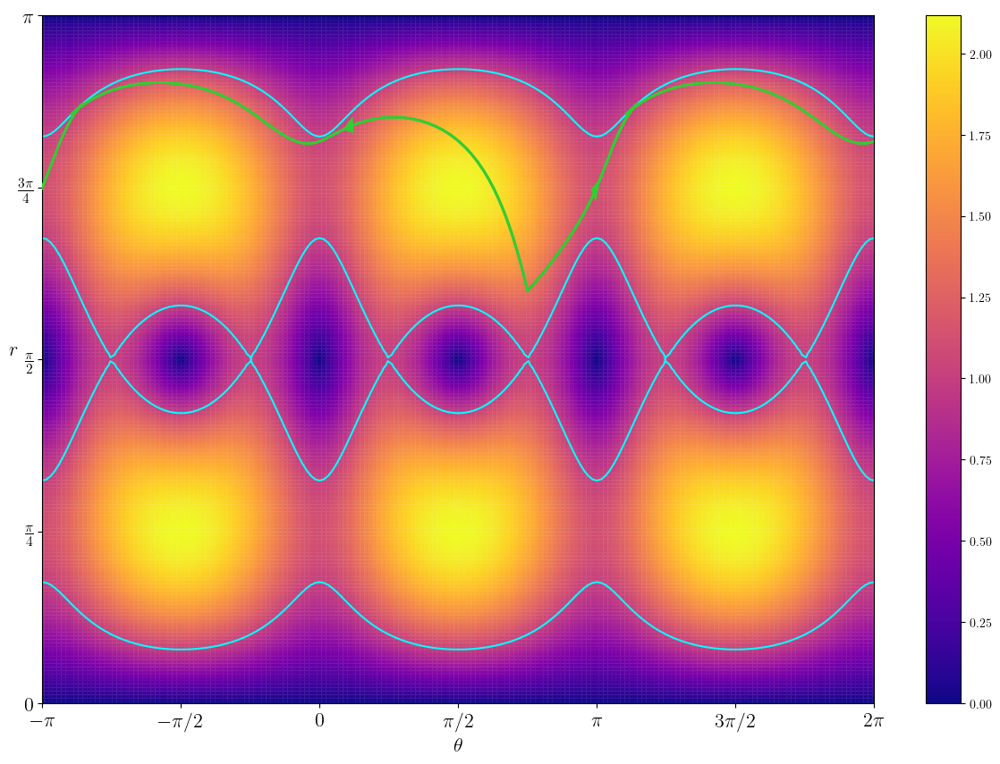

In [37]:
μ1 = μ1_fun(r0, θ0, γ1, γ2, γ3, α)
μ2 = μ2_fun(r0, θ0, γ1, γ2, γ3, α)
m2 = m2_fun(r0)

a = μ1**2+μ2**2*m2
b = 2*μ1
c = 1-m2*μ2*µ2

Δ = b**2-4*a*c

pr_1 = (-b-np.sqrt(Δ))/(2*a)
pr_2 = (-b+np.sqrt(Δ))/(2*a)

pθ_1_1 =  np.sqrt(m2*(1-pr_1**2))
pθ_1_2 = -np.sqrt(m2*(1-pr_1**2))
pθ_2_1 =  np.sqrt(m2*(1-pr_2**2))
pθ_2_2 = -np.sqrt(m2*(1-pr_2**2))

H_1_1 = H_init(pr_1, pθ_1_1, μ1, μ2)
H_1_2 = H_init(pr_1, pθ_1_2, μ1, μ2)
H_2_1 = H_init(pr_2, pθ_2_1, μ1, μ2)
H_2_2 = H_init(pr_2, pθ_2_2, μ1, μ2)

# anormales
pr_a_1 = pr_1
if np.abs(H_1_1) < np.abs(H_1_2):
    pθ_a_1 = pθ_1_1
else:
    pθ_a_1 = pθ_1_2

pr_a_2 = pr_2
if np.abs(H_2_1) < np.abs(H_2_2):
    pθ_a_2 = pθ_2_1
else:
    pθ_a_2 = pθ_2_2

# pr = sin(α)*sqrt(g1)
# pθ = cos(α)*sqrt(g2)
α_a_1  = math.atan2( pr_a_1, pθ_a_1/np.sqrt(m2))
p0_a_1 = prob.covector(np.array([r0, θ0]), α_a_1)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_1))

α_a_2  = math.atan2( pr_a_2, pθ_a_2/np.sqrt(m2))
p0_a_2 = prob.covector(np.array([r0, θ0]), α_a_2)
print(prob.Hamiltonian(0.0, np.array([r0, θ0]), p0_a_2))

# FIGURE
LW_GEO = 2.0

fig, ax = plot_F_contour(γ1, γ2, γ3, α);

αspan = [α_a_1, α_a_2]
tf = 2*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, linewidth=LW_GEO, color=color_abnormal_2D, figure=fig, force=True)
pass

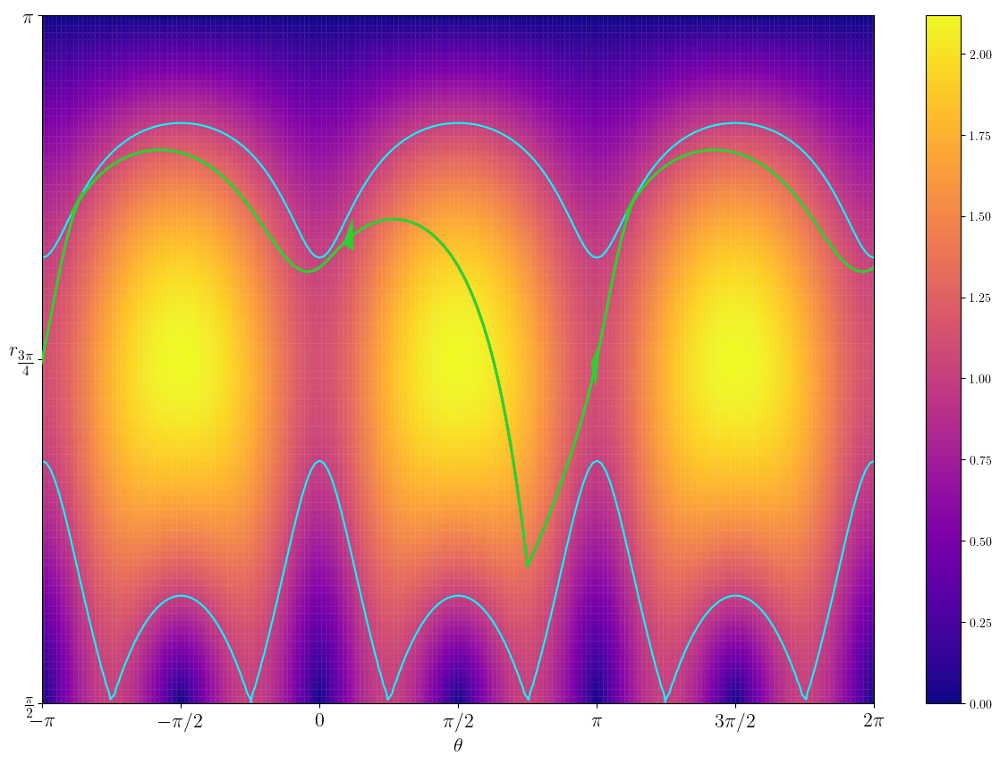

In [38]:
offset = np.pi/2
ax.set_xlim(-np.pi, 2*np.pi)
ax.set_ylim(np.pi/2-offset, np.pi-offset)
fig

# AUTRE CAS

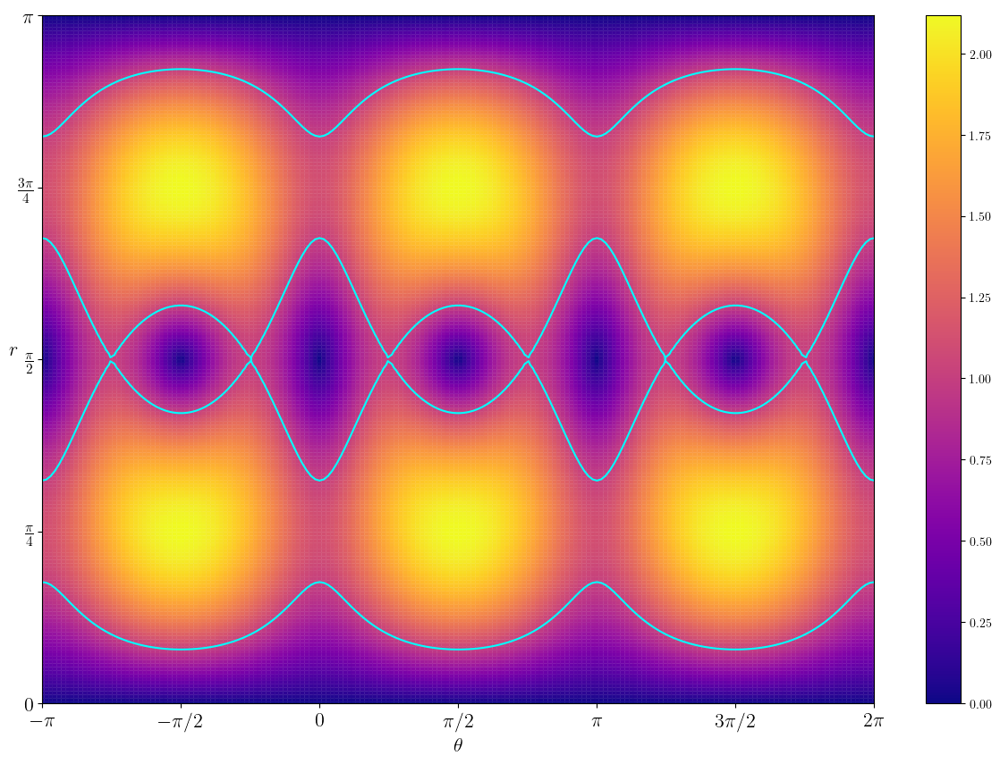

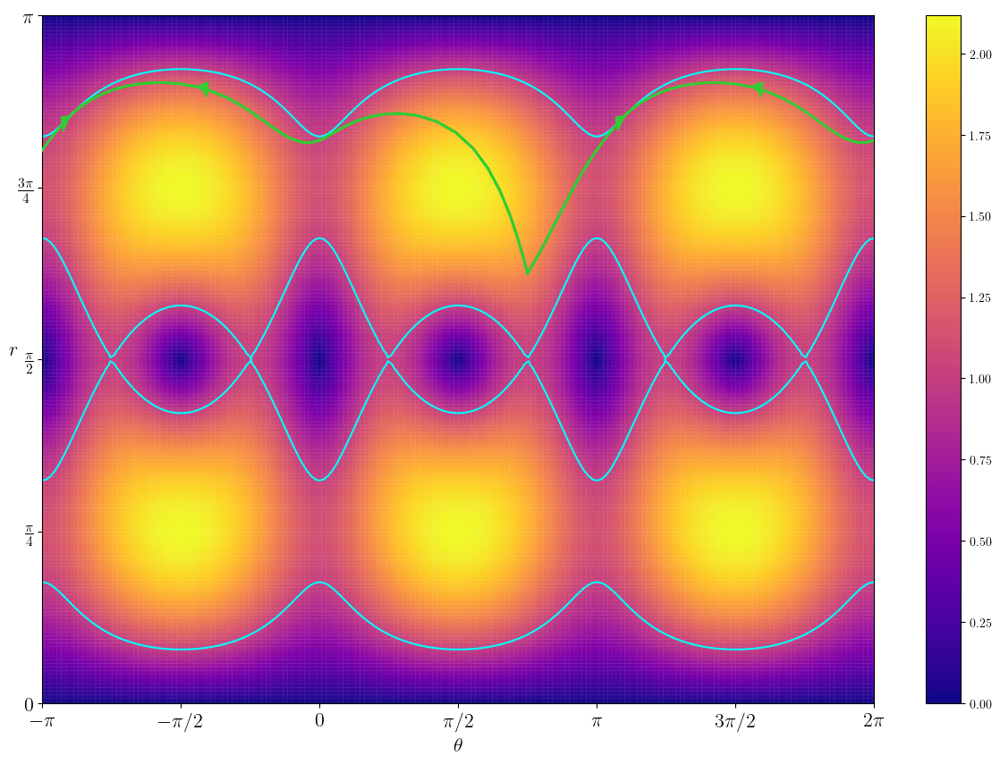

In [39]:
γ1, γ2, α = 1.0, 2.0, 2.0
γ3_limite_inf = γ2 + 1.0
γ3_limite_sup = γ2 + 2/(np.sqrt(1+α**2))

λ = 1
γ3 = γ3_limite_inf * (1.0-λ) + γ3_limite_sup*λ

fig, ax = plot_F_contour(γ1, γ2, γ3, α)

equator = np.pi/2.0

beta = 0.5
θ0 = 3*np.pi/4.0
r0 = 3*np.pi/4.0 * (1-beta) + np.pi/2.0 * beta
prob = initialize(θ0, r0, γ1, γ2, γ3, α)
geodesic = geometry2d.geodesic.Geodesic(prob)

#
μ1 = μ1_fun(r0, θ0, γ1, γ2, γ3, α)
μ2 = μ2_fun(r0, θ0, γ1, γ2, γ3, α)
m2 = m2_fun(r0)

a = μ1**2+μ2**2*m2
b = 2*μ1
c = 1-m2*μ2*µ2

Δ = b**2-4*a*c

pr_1 = (-b-np.sqrt(Δ))/(2*a)
pr_2 = (-b+np.sqrt(Δ))/(2*a)

pθ_1_1 =  np.sqrt(m2*(1-pr_1**2))
pθ_1_2 = -np.sqrt(m2*(1-pr_1**2))
pθ_2_1 =  np.sqrt(m2*(1-pr_2**2))
pθ_2_2 = -np.sqrt(m2*(1-pr_2**2))

H_1_1 = H_init(pr_1, pθ_1_1, μ1, μ2)
H_1_2 = H_init(pr_1, pθ_1_2, μ1, μ2)
H_2_1 = H_init(pr_2, pθ_2_1, μ1, μ2)
H_2_2 = H_init(pr_2, pθ_2_2, μ1, μ2)

# anormales

pr_a_1 = pr_1
if np.abs(H_1_1) < np.abs(H_1_2):
    pθ_a_1 = pθ_1_1
else:
    pθ_a_1 = pθ_1_2

pr_a_2 = pr_2
if np.abs(H_2_1) < np.abs(H_2_2):
    pθ_a_2 = pθ_2_1
else:
    pθ_a_2 = pθ_2_2

# pr = sin(α)*sqrt(g1)
# pθ = cos(α)*sqrt(g2)

α_a_1  = math.atan2( pr_a_1, pθ_a_1/np.sqrt(m2))
p0_a_1 = prob.covector(np.array([r0, θ0]), α_a_1)

α_a_2  = math.atan2( pr_a_2, pθ_a_2/np.sqrt(m2))
p0_a_2 = prob.covector(np.array([r0, θ0]), α_a_2)

# plot
LW_GEO = 2.0

fig, ax = plot_F_contour(γ1, γ2, γ3, α);

αspan = [α_a_1, α_a_2]
tf = 5*np.pi
geodesic.plot(alphas=αspan, tf=tf, view=PLANE, linewidth=LW_GEO, color=color_abnormal_2D, figure=fig, force=True)

offset = np.pi/2
#ax.set_xlim(0, np.pi)
#ax.set_ylim(np.pi/4-offset, np.pi-offset)

#gap = 0.3
#ax.set_xlim(3*np.pi/4-gap, 3*np.pi/4+gap)
#ax.set_ylim(np.pi/2-offset-gap, np.pi/2-offset+gap)

#αspan = np.linspace(0, 2*np.pi, 20)
#tf = 3*np.pi
#geodesic.plot(alphas=αspan, tf=tf, view=PLANE, linewidth=LW_GEO, color=color_hyperbolic_2D, figure=fig)
pass